Lagrangian code for simple pendulum

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
import sympy as smp
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

Defining all variables

In [2]:

t, g, l, m = smp.symbols('t g l m')
theta= smp.symbols(r'\theta', cls=smp.Function)

Defining $\theta(t)$ and $\dot{\theta}(t)$ and $\ddot{\theta}(t)$

In [3]:
theta = theta(t)
theta_d = smp.diff(theta, t)
theta_dd = smp.diff(theta_d, t)

Define x,y coordinate of mass

In [4]:

x=l*smp.sin(theta)
y=l*smp.cos(theta)

Lagrangian

In [5]:
T = smp.Rational(1,2) * m * (smp.diff(x,t)**2 + smp.diff(y,t)**2) 
   
V = m*g*(-l*smp.cos(theta))
L =T-V

Lagrangian equation 

In [6]:
LE = smp.diff(L, theta) - smp.diff(smp.diff(L, theta_d), t).simplify()

2nd order ODE

In [7]:
sols = smp.solve(LE, (theta_dd),
                simplify=False, rational=False)

Runge kutta method for solving 2nd ODE

In [12]:
import numpy as np
import matplotlib.pyplot as plt

# Constants
g = 9.81  # Acceleration due to gravity (m/s^2)
l = 1.0   # Length of the pendulum (m)

# Initial conditions
theta0 = 50  # Initial angle (radians)
omega0 = 1  # Initial angular velocity (radians/s)
t0 = 0.0      # Initial time (s)

# Time parameters
t_end = 10.0    # End time (s)
dt = 0.01       # Time step (s)

# Define the differential equation
def pendulum_deriv(t, state):
    theta, omega = state
    dtheta_dt = omega
    domega_dt = -(g / l) * np.sin(theta)
    return [dtheta_dt, domega_dt]

# Initialize arrays to store results
time_points = [t0]
theta_points = [theta0]
omega_points = [omega0]

# Fourth-order Runge-Kutta integration
while t0 < t_end:
    k1 = np.multiply(dt, pendulum_deriv(t0, [theta0, omega0]))
    k2 = np.multiply(dt, pendulum_deriv(t0 + 0.5 * dt, [theta0 + 0.5 * k1[0], omega0 + 0.5 * k1[1]]))
    k3 = np.multiply(dt, pendulum_deriv(t0 + 0.5 * dt, [theta0 + 0.5 * k2[0], omega0 + 0.5 * k2[1]]))
    k4 = np.multiply(dt, pendulum_deriv(t0 + dt, [theta0 + k3[0], omega0 + k3[1]]))
    
    theta0 = theta0 + (1/6) * (k1[0] + 2*k2[0] + 2*k3[0] + k4[0])
    omega0 = omega0 + (1/6) * (k1[1] + 2*k2[1] + 2*k3[1] + k4[1])
    t0 += dt
    
    time_points.append(t0)
    theta_points.append(theta0)
    omega_points.append(omega0)




Text(0.5, 0, '$ \\Theta $')

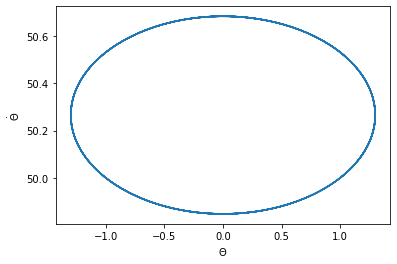

In [14]:
plt.plot(omega_points, theta_points)
plt.ylabel('$\dot \Theta$')
plt.xlabel('$ \Theta $')

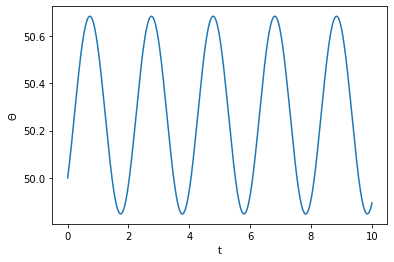

In [9]:
plt.ylabel('$ \Theta $')
plt.xlabel('t')
plt.plot(time_points, theta_points)

Text(0.5, 0, 't')

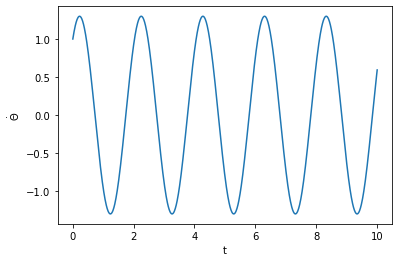

In [15]:
plt.plot(time_points, omega_points)
plt.ylabel('$ \dot \Theta $')
plt.xlabel('t')


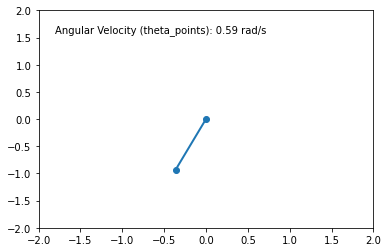

In [11]:

# Constants
l = 1.0   # Length of the pendulum (m)

# Create a function to calculate x and y positions from x and l
def calculate_positions(theta_points, l):
    x_positions = l * np.sin(theta_points)
    y_positions = -l * np.cos(theta_points)
    return x_positions, y_positions

# Create a function to update the pendulum's position and velocity in the animation
def update_pendulum(frame, theta_points, omega_points, l):
    x_positions, y_positions = calculate_positions(theta_points[frame], l)
    pendulum.set_data([0, x_positions], [0, y_positions])
    velocity_text.set_text(f'Angular Velocity (theta_points): {omega_points[frame]:.2f} rad/s')
    return pendulum, velocity_text

# Create a figure and axis for the animation
plt.figure()
plt.xlim(-2, 2)
plt.ylim(-2, 2)  # Adjust the y-limit for better visualization
pendulum, = plt.plot([], [], 'o-', lw=2)
velocity_text = plt.text(0.05, 0.9, '', transform=plt.gca().transAxes)

# Create the animation
ani = FuncAnimation(plt.gcf(), update_pendulum, frames=len(theta_points), fargs=(theta_points, omega_points, l), blit=True)

# Display the animation
HTML(ani.to_jshtml())
